<a href="https://colab.research.google.com/github/str4w/FaceAndAntiface/blob/main/Autoencode_Faces.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Autoencode Faces
================

Rupert Brooks, March 2025

Created for the PTPX2024 plotter art postcard exchange.

This notebook trains and applies a convolutional autoencoder on a dataset of human faces and background masks.

The autoencode is used to generate face samples which are halftoned and vectorized for the ptpx postcard layout.  

For inference, only a CPU is necessary, but for training, a T4 or similar GPU is required.

In [1]:
!pip install drawsvg vpype >pip.log
!pip install torchview >pip.log

In [2]:
from collections import Counter
from datetime import timedelta
import os
from pathlib import Path
import time

import drawsvg
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import PIL

import torch
from torch import nn
from torch.optim import Adam
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torchvision.io import read_image as tvio_read_image
from torchvision.io import ImageReadMode
import torchvision.transforms as transforms
import torchvision.transforms.v2 as v2
from torchview import draw_graph

device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
#os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
#device = "cpu"
print(f"Using {device} device")

import kagglehub # for downloading data

Using cpu device


Optional Logins
===============
Hugging Face login is only required if you want to push a trained model to your Hugging Face account.  Google drive login can be a convenient way to save model checkpoints and outputs, so that they don't disappear when your session ends.

For this model build, I did not use the HuggingFace library, so I manually uploaded the model to my HF account.

In [ ]:
from huggingface_hub import notebook_login
notebook_login()

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
!ls /content/gdrive/'My Drive'/data

Download datasets
================
This face dataset is freely available on Kaggle, and is a downsampled version of this much higher res original.

    Kaggle Version https://www.kaggle.com/datasets/yapwh1208/face-data
    Original https://data.vision.ee.ethz.ch/cvl/rrothe/imdb-wiki/

In the other notebook included with this project I bootstrap a model to generate a mask for each image.

    Model generated Faces https://www.kaggle.com/datasets/tiredrobot/model-generated-face-masks-for-yapwh-face-data


In [3]:
faces_path = kagglehub.dataset_download("yapwh1208/face-data")
print("Faces downloaded to", faces_path)
masks_path = kagglehub.dataset_download("tiredrobot/model-generated-face-masks-for-yapwh-face-data")
print("Masks downloaded to", masks_path)

100%|██████████| 49.1M/49.1M [00:00<00:00, 75.6MB/s]

Extracting files...


Faces downloaded to /root/.cache/kagglehub/datasets/yapwh1208/face-data/versions/1


100%|██████████| 17.6M/17.6M [00:00<00:00, 50.1MB/s]

Extracting files...


Masks downloaded to /root/.cache/kagglehub/datasets/tiredrobot/model-generated-face-masks-for-yapwh-face-data/versions/1


In [4]:
def get_face_file_index(faces_path, masks_path, enforce_description=True):
  """Create a dataframe index of face images and masks

  If enforce description is true, reject images where
  age is not between 0 and 120 inclusive, and gender
  is not 0 or 1.
  """
  files = sorted((Path(faces_path) / 'FaceData').glob('*.jpg'))
  # I personally acknowledge the existence of other
  # genders, but this is what the dataset description stated
  gender_lookup={'0':"M", '1':"F"}
  records=[]
  masks = {f.stem: str(f) for f in sorted((Path(masks_path) / 'CalculatedMasks').glob('*.jpg'))}
  for f in files:
    try:
      age, gender, _ = f.name.split("_", maxsplit=2)
      age=int(age)
      if enforce_description:
        assert age >= 0 and age <= 120, f"Unexpected age {age}"
      if gender in gender_lookup:
        gender = gender_lookup[gender]
      else:
        if enforce_description:
          raise Exception(f"Unexpected gender {gender}")
        else:
          gender = "F" # ¯\_(ツ)_/¯
      mask = masks.get(f.stem)
      if mask:
        mask = str(mask)
      records.append((age, gender, str(f), mask))
    except Exception as e:
      print(f"Error processing {f}")
      print(e)
  df = pd.DataFrame(records, columns=['age', 'gender', 'path', 'mask_path'])
  return df


In [5]:
df = get_face_file_index(faces_path, masks_path)
print("Found", len(df), "face files")
gender_counts = Counter(df.gender)
print("Gender counts:", [f"{k}: {v}" for k,v in gender_counts.items()])
print(len(df.query("`mask_path`.notna()")), "have masks")
# One image does not conform to dataset spec and has gender 3.  We exclude it.

Error processing /root/.cache/kagglehub/datasets/yapwh1208/face-data/versions/1/FaceData/61_3_20170109150557335.jpg.chip.jpg
Unexpected gender 3
Found 9779 face files
Gender counts: ['F: 5407', 'M: 4372']
9779 have masks


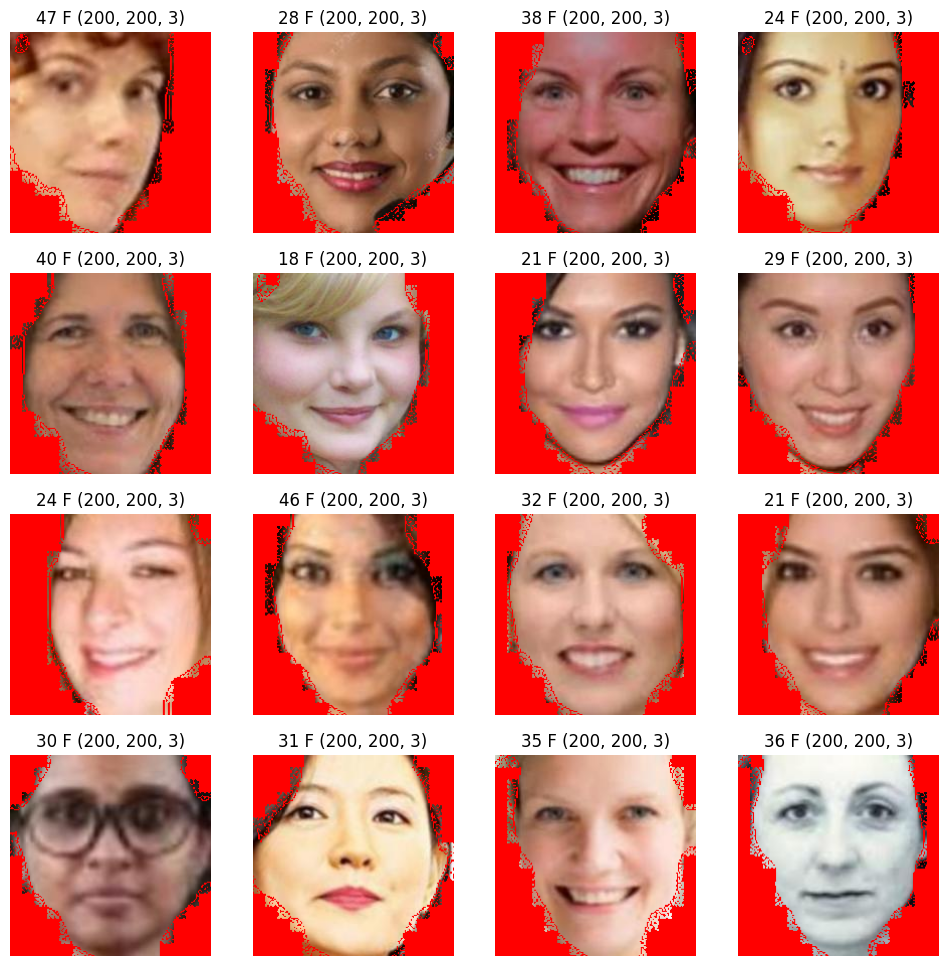

In [6]:
# Select examples of faces of women at least 16
subset = df.query("`gender` == 'F' and `age` > 15 and age < 50").sample(16)
fig, ax = plt.subplots(4,4, figsize=(12,12))
for i in range(4):
  for j in range(4):
    row = subset.iloc[i*4+j]
    z = plt.imread(row.path).copy()
    m = np.array(PIL.Image.open(row.mask_path).resize((200,200)))
    m = m == 0
    z[:,:,0][m]=255
    z[:,:,1][m]=0
    z[:,:,2][m]=0
    ax[i,j].imshow(z)
    ax[i,j].set_title(f"{row.age} {row.gender} {z.shape}")
    ax[i,j].axis('off')
plt.show()

In [7]:

class FaceDataset(Dataset):
    def __init__(self, table, transform=None, target_transform=None):
      self.table = table
      self.transform = transform
      self.target_transform = target_transform

    def __len__(self):
        return len(self.table)

    def __getitem__(self, idx):
      row = self.table.iloc[idx].to_dict()
      img_path = row["path"]
      mask_path = row["mask_path"]
      image = tvio_read_image(img_path)
      #print(image.shape)
      mask = v2.Resize((image.shape[1],image.shape[2]))(tvio_read_image(mask_path, ImageReadMode.RGB))
      green_mask=mask+0
      green_mask[0,:,:]=255
      green_mask[2,:,:]=255
      green_mask = green_mask <128
      mask[1,:,:]=255
      mask = mask <128
      image[mask]=0
      if green_mask.sum() > 0:
        zonemin=image[green_mask].min()
        zonemax=image[green_mask].max()
        zonefactor=128/(zonemax-zonemin)
        zoneoffset=64
        image[green_mask]=((image[green_mask]-zonemin)*zonefactor+zoneoffset).type(torch.uint8)
      label = (row['age'],torch.Tensor((1.0, 0.0)) if row['gender'] == 'M' else torch.Tensor((0.0, 1.0)))
      if self.transform:
          image = self.transform(image)
      if self.target_transform:
          label = self.target_transform(label)
      return image, label

In [8]:
# Initial experiments showed that when all faces were used, the pair of a face
# and its opposite always seemed to have one very young, babyish face.  This
# was not all that interesting artistically.  Here we limit the faces to 16yrs
# or older, to get results that generally look like adults.

shuffled_df = df.query("`age` > 15").sample(frac=1, random_state=420)
train_test_fraction=0.8
split_index = int(len(shuffled_df)*train_test_fraction)
train_df = shuffled_df.iloc[:split_index]
test_df = shuffled_df.iloc[split_index:]
the_mean=torch.tensor([0.6571, 0.4978, 0.4273])
the_std=torch.tensor([0.2155, 0.1939, 0.1865])
transforms = v2.Compose([
    v2.RandomHorizontalFlip(p=0.5),
    v2.ToDtype(torch.float32, scale=True),
    v2.Resize((128,128)),
    v2.Normalize(mean=the_mean, std=the_std),
])
test_transforms = v2.Compose([
    v2.ToDtype(torch.float32, scale=True),
    v2.Resize((128,128)),
    v2.Normalize(mean=the_mean, std=the_std),
])
train_dataset = FaceDataset(train_df, transform=transforms)
test_dataset = FaceDataset(test_df, transform=test_transforms)
print("Train size:", len(train_dataset))
print("Test size:", len(test_dataset))


Train size: 4935
Test size: 1234


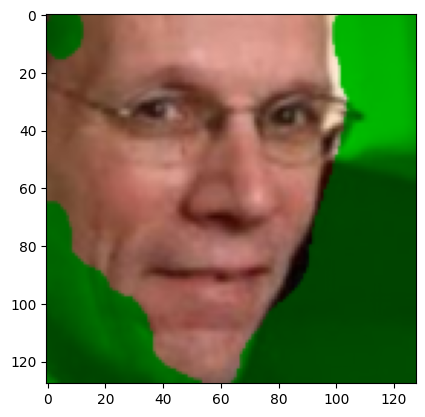

In [9]:
z=train_dataset[2]
denormalize=v2.Normalize(mean=-the_mean/the_std, std=1/the_std)
plt.imshow(denormalize(z[0]).permute(1,2,0))
plt.show()


Build VAE Model
===============

The model design uses a regression head for the age, and a classification head for the gender.  Theoretically this could provide additional signal to increase the expressiveness of the latent space.  However, in practice, the effect was minimal.

This design is not optimal, it is just where I stopped.

In [10]:
class VAE(nn.Module):
    def __init__(self, latent_dim):
        super().__init__()
        self.variant=f"8_lyr_{latent_dim}_lat_bg_older"
        hidden_dim=64*8*8
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, 3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.Conv2d(16, 16, 3, stride=2, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.Conv2d(16, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Flatten(),
        )
        # latent mean and variance
        self.mean_layer = nn.Linear(hidden_dim, latent_dim)
        self.logvar_layer = nn.Linear(hidden_dim, latent_dim)

        self.gender_classifier = nn.Sequential(
            nn.Linear(latent_dim, 2),
            nn.Sigmoid()
        )

        self.age_regressor = nn.Sequential(
            nn.Linear(latent_dim, 1),
            nn.ReLU()
        )

        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, hidden_dim),
            nn.ReLU(),
            nn.Unflatten(1, (64, 8, 8)),
            nn.UpsamplingBilinear2d(scale_factor=2),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.UpsamplingBilinear2d(scale_factor=2),
            nn.Conv2d(64, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.UpsamplingBilinear2d(scale_factor=2),
            nn.Conv2d(32, 16,  3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.Conv2d(16, 16, 3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.UpsamplingBilinear2d(scale_factor=2),
            nn.Conv2d(16, 16,  3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.Conv2d(16, 3, 3, padding=1)
            #nn.Sigmoid(),
        )

    def reparameterization(self, mean, var):
        epsilon = torch.randn_like(var).to(device)
        z = mean + var*epsilon
        return z

    def encode(self, x):
        x = self.encoder(x)
        mean, logvar = self.mean_layer(x), self.logvar_layer(x)
        return mean, logvar

    def decode(self, x):
        return self.decoder(x)

    def forward(self, x):
        mean, logvar = self.encode(x)
        z = self.reparameterization(mean, logvar)
        x_hat = self.decode(z)
        gender = self.gender_classifier(z)
        age = self.age_regressor(z)
        return x_hat, gender, age, mean, logvar

In [11]:
model = VAE(128).to(device)
optimizer = Adam(model.parameters(), lr=1e-3)

x, a_g = train_dataset[0]
a = a_g[0]
g = a_g[1]

input_batch = x.unsqueeze(0)
x_hat, gender, age, mean, log_var = model(input_batch.to(device))
print("Variable shapes")
print("Input:")
print("  input_batch:", input_batch.shape)
print("Output:")
print("  x_hat:", x_hat.shape)
print("  gender:", gender.shape)
print("  age:", age.shape)
print("  mean:", mean.shape)
print("  log_var:", log_var.shape)
print("Model Parameters")
print("  Parameters requiring gradient:",
      sum(p.numel() for p in model.parameters() if p.requires_grad))
print("  Parameters not requiring gradient:",
      sum(p.numel() for p in model.parameters() if not p.requires_grad))

def loss_function(x, g_true, a_true, x_hat, gender, age, mean, log_var):
    reproduction_loss = nn.functional.mse_loss(x_hat, x)
    gender_loss = nn.functional.cross_entropy(gender, g_true)
    age_loss = nn.functional.mse_loss(age, a_true.unsqueeze(1).float())
    KLD = - 0.5 * torch.sum(1+ log_var - mean.pow(2) - log_var.exp())

    return 3*reproduction_loss + KLD + 0.1*gender_loss + 0.1 * age_loss

Variable shapes
Input:
  input_batch: torch.Size([1, 3, 128, 128])
Output:
  x_hat: torch.Size([1, 3, 128, 128])
  gender: torch.Size([1, 2])
  age: torch.Size([1, 1])
  mean: torch.Size([1, 128])
  log_var: torch.Size([1, 128])
Model Parameters
  Parameters requiring gradient: 1835990
  Parameters not requiring gradient: 0


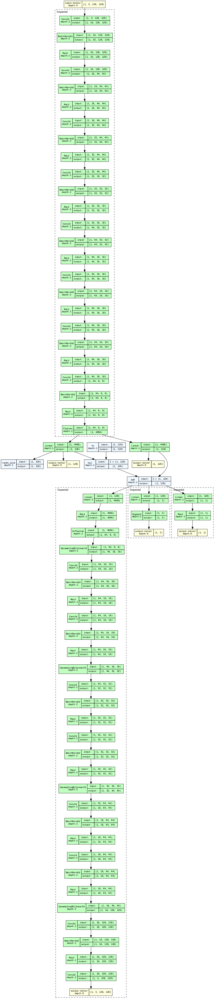

In [12]:
model_graph = draw_graph(model, input_size=x.unsqueeze(0).shape, expand_nested=True)
model_graph.visual_graph.render(filename='model_graph', format='png')
PIL.Image.open('model_graph.png')

In [18]:
model_save_path = Path('/tmp/FaceVAE')
# if you have connected to the google drive you can save there
# useful to avoid losing your checkpoints if the Colab hangs up on you.
# model_save_path=Path('/content/gdrive/My Drive/models/FaceVAE')

In [19]:
batch_size=64
test_batch_size=8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size, shuffle=True)

Model Training
==============
If you want to load the pretrained model and do inference you can skip this and go to the inference section below.

In [ ]:
def train(model, optimizer, epochs, device):
    overall_start_time = time.time()
    for epoch in range(epochs):
        model.train()
        start_time = time.time()
        overall_loss = 0
        for batch_idx, (x, a_g) in enumerate(train_loader):
            x = x.to(device)
            age=a_g[0].to(device)
            gender=a_g[1].to(device)
            optimizer.zero_grad()

            x_hat, gender_hat, age_hat, mean, log_var = model(x)
            loss = loss_function(x, gender, age, x_hat, gender_hat, age_hat, mean, log_var)

            overall_loss += loss.item()

            loss.backward()
            optimizer.step()

        overall_test_loss = 0
        overall_age_error = 0
        overall_gender_error = 0
        for test_batch_idx, (x, a_g) in enumerate(test_loader):
            model.eval()
            x = x.to(device)
            age=a_g[0].to(device)
            gender=a_g[1].to(device)
            optimizer.zero_grad()
            x_hat, gender_hat, age_hat, mean, log_var = model(x)
            loss = loss_function(x, gender, age, x_hat, gender_hat, age_hat, mean, log_var)
            age_error =torch.sum(age.to('cpu')-age_hat.to('cpu'))
            gender_error = torch.sum(torch.abs(gender.to('cpu')-torch.round(gender_hat.to('cpu'))))
            overall_test_loss += loss.item()
            overall_age_error += age_error.item()
            overall_gender_error += gender_error.item()




        end_time = time.time()
        estimated_remaining_time = (end_time - overall_start_time) * (epochs - epoch - 1) / (epoch + 1)
        print("\tEpoch", epoch + 1,
              "\tAverage Train Loss: ", overall_loss/(batch_idx*batch_size),
              "\tAverage Test Loss: ", overall_test_loss/(test_batch_idx*test_batch_size),
              "\tAverage Age Error: ", overall_age_error/(test_batch_idx*test_batch_size),
              "\tAverage Gender acc: ", 100*(1-overall_gender_error/(test_batch_idx*test_batch_size)),
              "\tTime: ", str(timedelta(seconds=end_time - start_time)),
              "\tElapsed Time: ", str(timedelta(seconds=end_time - overall_start_time)),
              "\tRemaining Time: ", str(timedelta(seconds=estimated_remaining_time)))
        model_save_name = model_save_path / f"model_{model.variant}_epoch_{epoch+1:03d}.pt"
        print("\tSaving model to", model_save_name)
        torch.save(model.state_dict(), model_save_name)
    return overall_loss

train(model, optimizer, epochs=50, device=device)

Inference
=========
If you just trained the model, don't replace it with the downloaded weights from
HF.  

In [13]:
# To store the model on Hugging Face, I manually downloaded the weights and
# uploaded them to the web interface.

In [14]:
from huggingface_hub import hf_hub_download

In [15]:
model_file = hf_hub_download(repo_id="TiredRobot/FaceVAE", filename="model_8_lyr_128_lat_bg_older_epoch_050.pt")

(…)odel_8_lyr_128_lat_bg_older_epoch_050.pt:   0%|          | 0.00/7.39M [00:00<?, ?B/s]

In [16]:
model = VAE(128)
model.load_state_dict(torch.load(model_file, map_location=torch.device(device)))

<All keys matched successfully>

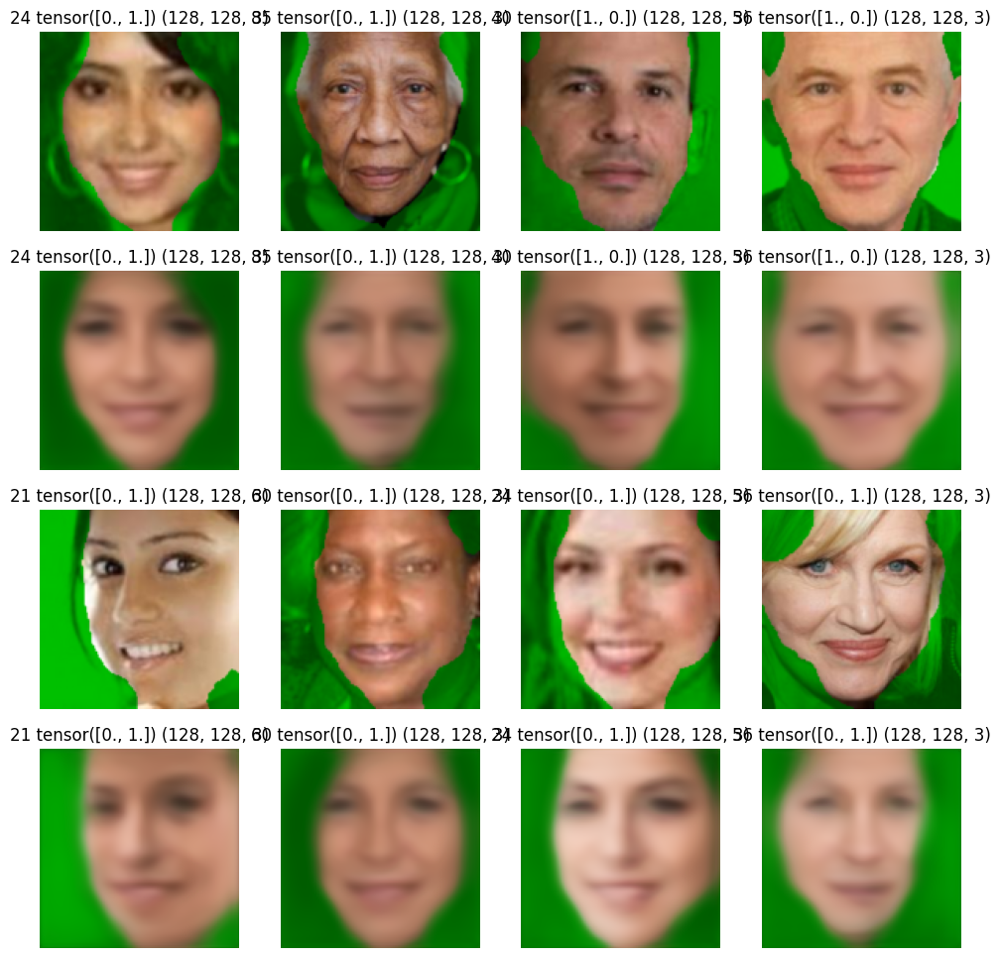

In [20]:
# Visually examine some output

test_batch = next(iter(test_loader))
model.eval()
result = model(test_batch[0].to(device))
fig, ax = plt.subplots(4,4, figsize=(12,12))
for i in range(2):
  for j in range(4):
    idx = i*4+j
    z_in = denormalize(test_batch[0][idx].squeeze()).permute(1,2,0)
    z_label = (test_batch[1][0][idx], test_batch[1][1][idx])
    z_out = denormalize(result[0][idx].detach().cpu().squeeze()).permute(1,2,0)
    ax[i*2,j].imshow(z_in.numpy().clip(0,1))
    ax[i*2,j].set_title(f"{z_label[0]} {z_label[1]} {tuple(z_in.shape)}")
    ax[i*2,j].axis('off')
    ax[i*2+1,j].imshow(z_out.numpy().clip(0,1))
    ax[i*2+1,j].set_title(f"{z_label[0]} {z_label[1]} {tuple(z_out.shape)}")
    ax[i*2+1,j].axis('off')
plt.show()

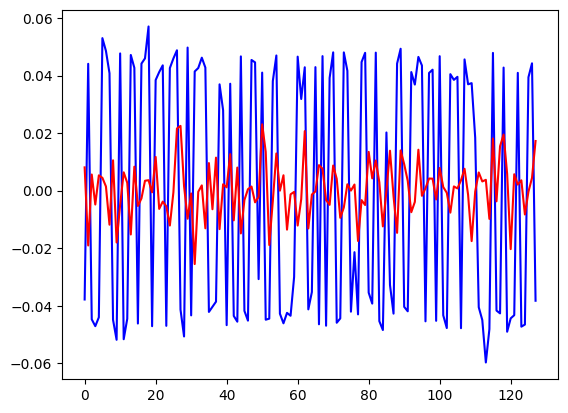

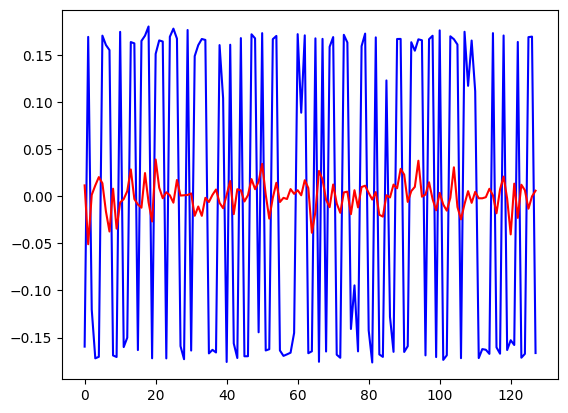

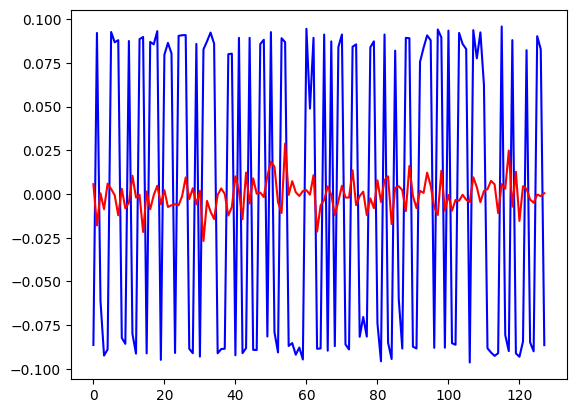

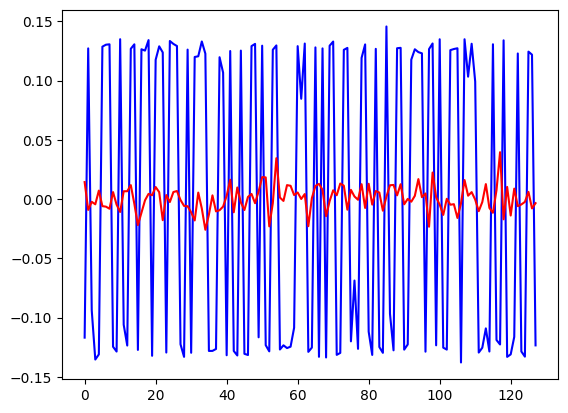

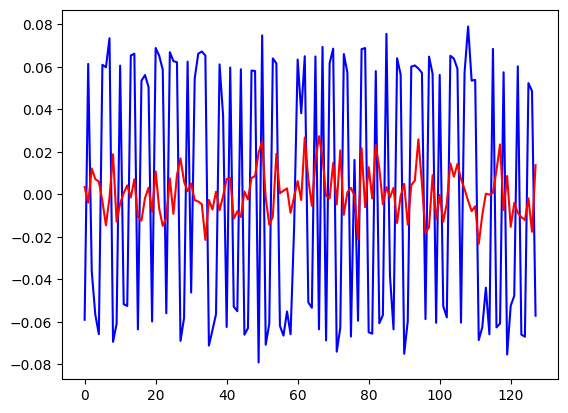

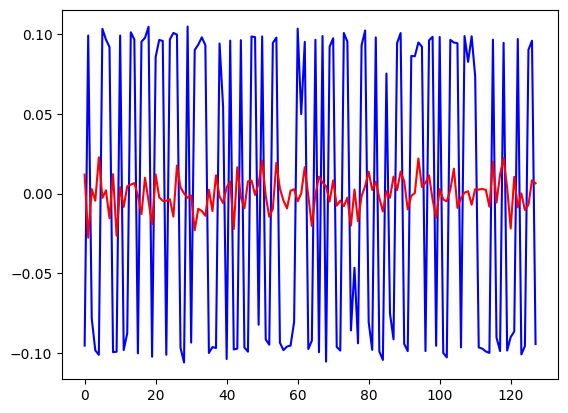

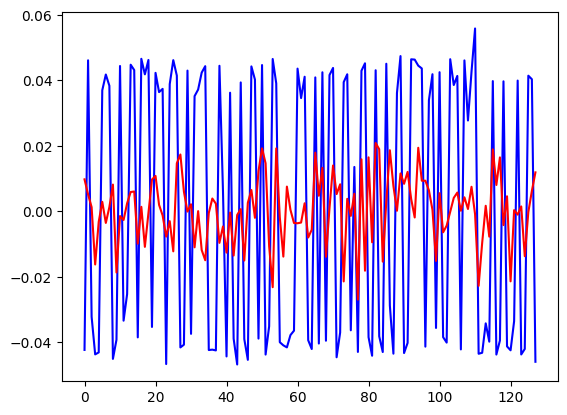

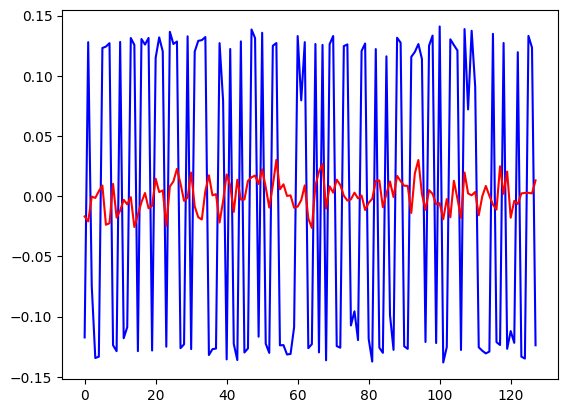

In [21]:
# visually examine the latent space.
for i in range(8):
  plt.plot(range(128),result[3][i].detach().cpu().numpy(),"b-")
  plt.plot(range(128),result[4][i].detach().cpu().numpy(),"r-")
  plt.show()

Making Postcards
================
The postcard design for Face and Antiface consists of two, somehow opposite, faces generated from the latent space.  The faces are generated from a random, binary vector scaled to the effective limits of the latent space.  One face is generated from the inverse of the vector for the other.

The faces are then halftoned.  The masked section of the face is presented in a different color from the face itself.

In [22]:
def generate_face(scale, z_sample=None):
    """Generate a face and antiface
       from either a provided vector, or a scaled random vector"""
    if z_sample is None:
      z_sample = scale*torch.randn((1,128,), dtype=torch.float32).to(device)
    x_decoded = model.decode(z_sample)
    face = denormalize(x_decoded.detach().cpu()).squeeze().permute(1,2,0)
    x_decoded = model.decode(-1*z_sample)
    antiface = denormalize(x_decoded.detach().cpu()).squeeze().permute(1,2,0)
    return face.numpy(), antiface.numpy(), z_sample.detach().cpu().numpy()

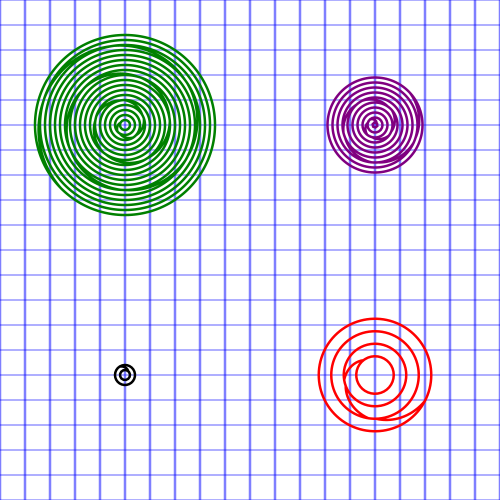

In [23]:
def render_halftone_circle(x, y, size, density,
                           mode="ring", penwidth=0.2, **kwargs):
  """ Renders a circular halftone dot at x, y

  size - the radius which would cause the circle to just touch
         an neighbor of the same size.
  density - the visual fill density we are trying to achieve.
            A density of 0 is empty, of 1 has the circle touching
            its neighbor.  A circle can be filled more than 100%,
            to cause overlap with the neighbors
  mode - two modes
      fill - start from the center and fill outwards
      ring - achieve more range by allowing the dot to be hollow
  penwidth - smallest possible line, as a fraction of size.  Controls
             smallest possible dot, number of spirals

  """
  penwidth = penwidth/size #scale penwidth
  if density < penwidth:
    return # too small to draw
  if mode == "fill":
    outermost = density
    innermost = penwidth
  elif mode =="ring":
    if density >= 1:
      outermost = density
      innermost = penwidth
    else:
      outermost = 0.5 + density/2
      innermost = 0.5 - density/2
  else:
    raise Exception("Unknown mode")
  nrings = int(max(np.ceil((outermost-innermost +.01)/penwidth),1))
  ringradii = np.linspace(outermost, innermost, nrings) * size
  offset = np.random.uniform(0, 2*np.pi)
  def ring_points(startangle, radius):
    anglestepradians = penwidth/radius
    steps = np.ceil(2.0*np.pi/anglestepradians) + 1 # one extra step
                                                    # for the start point
    points = [radius*np.array([np.cos(startangle+i*anglestepradians),
                               np.sin(startangle+i*anglestepradians)])
      for i in range(int(steps))]
    return points, startangle+anglestepradians*steps
  def ring_ramp(startangle, endangle, startradius, endradius):
    anglestepradians = penwidth/max(startradius, endradius)
    steps = int(max(np.ceil((endangle-startangle)/anglestepradians), 2))
    points = [(endradius*i/steps+startradius*(steps-i)/steps)
               * np.array([np.cos(startangle+i*anglestepradians),
                           np.sin(startangle+i*anglestepradians)])
      for i in range(int(steps+1))]
    return points, startangle+anglestepradians*(steps+1)

  points, offset = ring_points(offset, ringradii[0])
  for i in range(1,len(ringradii)):
    ramppoints, offset = ring_ramp(offset, offset+np.pi/3,
                                   ringradii[i-1], ringradii[i])
    points += ramppoints
    ringpoints, offset = ring_points(offset, ringradii[i])
    points += ringpoints
  p = drawsvg.Path(**kwargs)
  p.M(points[0][0]+x, points[0][1]+y)
  for px,py in points[1:]:
    p.L(px+x, py+y)
  return p

# Test drawing
d = drawsvg.Drawing(20, 20,
                      origin='center', displayInline=False)
# grid
for i in range(-10,11):
  d.append(drawsvg.Line(-10,i,10,i,
                        stroke_width=0.05, stroke="blue", stroke_opacity=0.5))
  d.append(drawsvg.Line(i,-10,i,10,
                        stroke_width=0.1, stroke="blue", stroke_opacity=0.5))

d.append(render_halftone_circle(-5,5, 2, 0.2, penwidth=0.2, mode="fill",
                                stroke_width=0.1, stroke="black", fill='none'))
d.append(render_halftone_circle(5,5, 3, 0.5,  penwidth=0.4, mode="ring",
                                stroke_width=0.1, stroke="red", fill='none'))
d.append(render_halftone_circle(-5,-5, 3, 1.2, mode="fill",
                                stroke_width=0.1, stroke="green", fill='none'))
d.append(render_halftone_circle(5,-5, 2, 0.9, mode="ring",
                                stroke_width=0.1, stroke="purple", fill='none'))
d.set_render_size(500,500)



In [24]:
def render_image_for_plotter_as_groups(img, spacing, name, namebg,
                                       halftone_offset="normal",
                                       outline_box=False):
  """Renders an image as a group of halftone circles
     with one group for the foreground and one for the background

     spacing - the spacing between circles in pixels
     name, namebg - the names of the groups to return
     halftone_offset - one of normal, left, right
         Accidental discovery, the halftone can be skewed to make
         one edge ragged and one edge smooth.  Right/left control
         the smooth edge.
     outline_box - if true, draw a box around the image
  """
  img = img.astype(float)/img.max()
  img = np.transpose(img,(1,0,2))
  s_2 = spacing/2
  cutoff=s_2/8
  step=s_2/8
  drawing_range = (img.shape[0], img.shape[1])
  group=drawsvg.Group(id=name, name=name, label=name)
  bggroup=drawsvg.Group(id=namebg, name=namebg, label=namebg)
  row_parity=0
  circles=[]
  circlesbg=[]
  min_val=99999
  max_val=-99999
  def fxidx(x):
    return min(max(int(np.round(x)),0),img.shape[0]-1)
  def fyidx(y):
    return min(max(int(np.round(y)),0),img.shape[1]-1)
  for y in np.linspace(s_2, img.shape[1]-s_2, int(img.shape[1]/spacing)):
    if halftone_offset == "normal":
      xstart = s_2 + row_parity*s_2
      xend = img.shape[0]-s_2 - row_parity*s_2
      xnum = int(img.shape[0]/spacing) - 1
    elif halftone_offset == "left":
      xstart = s_2
      xend = img.shape[0]-s_2 - row_parity*s_2
      xnum = int(img.shape[0]/spacing)
    elif halftone_offset == "right":
      xstart = s_2 + row_parity*s_2
      xend = img.shape[0]-s_2
      xnum = int(img.shape[0]/spacing)
    else:
      raise ValueError(f"Unknown halftone offset {halftone_offset}")
    for x in np.linspace(xstart, xend, xnum):
      xlow = fxidx(x-s_2)
      xhigh = fxidx(x+s_2)+1
      ylow = fyidx(y-s_2)
      yhigh = fyidx(y+s_2)+1
      vals = img[xlow:xhigh, ylow:yhigh, :]
      valsred = img[xlow:xhigh, ylow:yhigh, 0]
      valsgreen = img[xlow:xhigh, ylow:yhigh, 1]
      valsblue = img[xlow:xhigh, ylow:yhigh, 2]
      avggreen = valsgreen.mean()
      avgred = valsred.mean()
      avgblue = valsblue.mean()

      if avggreen > (avgred+avgblue)/1.5: # significantly green, its bg
        intensity = np.median(valsgreen)
        circlesbg.append((x-img.shape[0]/2,y-img.shape[1]/2,intensity))
      else:
        intensity = np.median(vals)
        circles.append((x-img.shape[0]/2,y-img.shape[1]/2,intensity))
      if intensity > max_val:
        max_val=intensity
      if intensity < min_val:
        min_val=intensity
    row_parity=1-row_parity
  c_range=max_val-min_val
  for c in circles:
    circ = render_halftone_circle(c[0],c[1], 1.2*s_2, 1-(c[2]-min_val)/c_range,
                                  mode="fill", penwidth=0.2,
                                  stroke="black", stroke_width=0.2, fill="none")
    if circ is not None:
      group.append(circ)
  for c in circlesbg:
    circ = render_halftone_circle(c[0],c[1], 1.2*s_2, 1 -(c[2]-min_val)/c_range,
                                  mode="fill", penwidth=0.2,
                                  stroke="blue", stroke_width=0.2, fill="none")
    if circ is not None:
      bggroup.append(circ)
  if outline_box:
    bggroup.append(drawsvg.Rectangle(-img.shape[0]/2,
                                     -img.shape[1]/2,
                                     img.shape[0],
                                     img.shape[1],
                                     stroke_width=0.2,
                                     stroke="purple",
                                     fill="none"))
  return group, bggroup, drawing_range

def render_image_for_plotter(img, spacing):
  """ Renders an image as a plottable SVG """
  g, bg, drawing_range =render_image_for_plotter_as_groups(img,
                                                           spacing,
                                                           "face",
                                                           "facebg")
  d = drawsvg.Drawing(drawing_range[0], drawing_range[1],
                       origin='center', displayInline=False)
  d.append(g)
  d.append(bg)
  d.set_render_size(500,int(500*drawing_range[1]/drawing_range[0]))
  return d

In [27]:
def render_sidebyside(face, antiface, z_sample, spacing=4,
                      latent_mode="alternating"):
  """The main, final postcard renderer"""
  # Latent mode can be alternating or barcode
  # barcode was the final design chosen
  # alternative was a bar chart, in red and green
  face_group, face_bggroup, drawing_range_face = \
     render_image_for_plotter_as_groups(face, spacing,
                                        "face", "facebg",
                                        halftone_offset="left")
  antiface_group, antiface_bggroup, drawing_range_antiface = \
    render_image_for_plotter_as_groups(antiface, spacing,
                                       "antiface", "antifacebg",
                                       halftone_offset="right")
  face_group.args["transform"] = \
      f"translate({-drawing_range_face[0]/1.77}, 0.0)"
  face_bggroup.args["transform"] = \
      f"translate({-drawing_range_face[0]/1.77}, 0.0)"
  antiface_group.args["transform"] = \
      f"translate({drawing_range_face[0]/1.77}, 0.0)"
  antiface_bggroup.args["transform"] = \
      f"translate({drawing_range_face[0]/1.77}, 0.0)"
  d = drawsvg.Drawing(drawing_range_face[0]*2.1, drawing_range_face[1],
                       origin='center', displayInline=False)
  d.append(face_group)
  d.append(face_bggroup)
  d.append(antiface_group)
  d.append(antiface_bggroup)

  assert len(z_sample.flatten()) == drawing_range_face[1]
  maxabsz=np.abs(z_sample).max()
  if latent_mode == "alternating":
    gpos=drawsvg.Group(id="zpos", name="zpos", label="zpos")
    gneg=drawsvg.Group(id="zneg", name="zneg", label="zneg")
    gzero=drawsvg.Group(id="zzero", name="zzero", label="zzero")
    h=0.8
    offsetx=0
    offsety=drawing_range_face[1]*0.01
    yscale=0.98
    for i, v in enumerate(z_sample.flatten()):
      y=(i*yscale-drawing_range_face[1]/2)-h/2
      w=abs(v)/maxabsz * drawing_range_face[0]*0.04
      if v > maxabsz*0.02:
        gpos.append(drawsvg.Rectangle(-w+offsetx,y+offsety,w,h,
                                      stroke="green",fill="none",
                                      stroke_width="0.2"))
        for f in [0.2,0.4,0.6,0.8]:
          gpos.append(drawsvg.Line(-w+offsetx,y+offsety+f*h,0,y+offsety+f*h,
                                   stroke="green", stroke_width="0.2",
                                   fill="none"))
      elif v < -maxabsz*0.02:
        gneg.append(drawsvg.Rectangle(0+offsetx,y+offsety,w,h,
                                      stroke="red",fill="none",
                                      stroke_width="0.2"))
        for f in [0.2,0.4,0.6,0.8]:
          gneg.append(drawsvg.Line(0+offsetx,y+offsety+f*h,w,y+offsety+f*h,
                                   stroke="red", stroke_width="0.2",
                                   fill="none"))
      else:
        gzero.append(drawsvg.Line(0+offsetx,y+offsety,0+offsetx,y+offsety+h,
                                  stroke="black", stroke_width="0.2",
                                  fill="none"))
    d.append(gpos)
    d.append(gneg)
    d.append(gzero)
  elif latent_mode == "barcode":
    gbar=drawsvg.Group(id="barcode", name="barcode", label="barcode")
    h=0.5
    w=drawing_range_face[0]*0.04
    offsetx=0#-drawing_range_face[0]*0.015
    offsety=drawing_range_face[1]*0.0
    yscale=1.1
    for i, v in enumerate(z_sample.flatten()):
      barh = ((v/maxabsz/2)+0.5)*h
      y=(i*yscale-drawing_range_face[1]/2)
      barstart=y-barh/2
      barend=y+barh/2
      bars = np.linspace(barstart, barend, max(1,int(barh/0.1)))
      for bar in bars:
        gbar.append(drawsvg.Line(-w+offsetx,bar+offsety,w+offsetx,bar+offsety,
                                 stroke="black", stroke_width="0.2",
                                 fill="none"))
    d.append(gbar)
  else:
    raise ValueError(f"Unknown latent mode {latent_mode}")

  d.set_render_size(1000, 500)
  return d

In [28]:
# You could save to google drive for easy storage and download
#drawing_save_path=Path('/content/gdrive/My Drive/face_antiface2')
drawing_save_path = Path('/tmp/face_antiface2')
!mkdir -p "{drawing_save_path}"

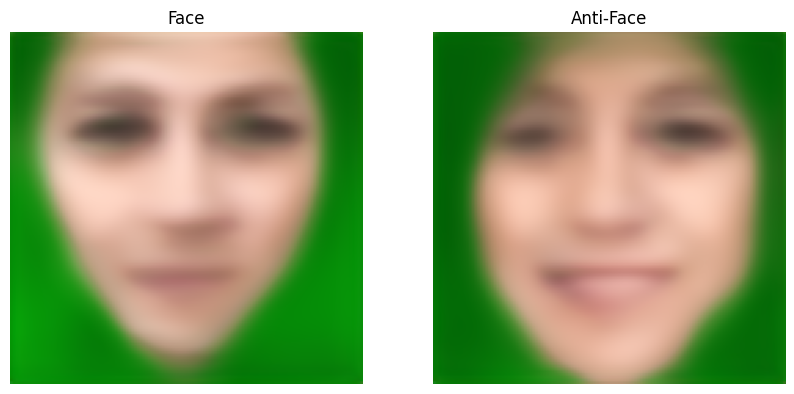

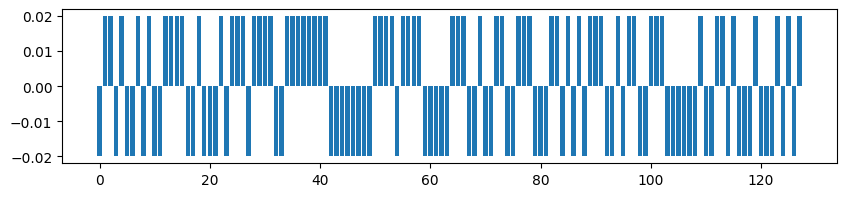

In [29]:
random_vector = torch.Tensor((0.5+np.random.randint(-1,1,(1,128)))*2)*0.02
face, antiface, z= generate_face(0.02, random_vector)

plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
plt.imshow((face-face.min())/(face.max()-face.min()))
plt.title("Face")
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow((antiface-antiface.min())/(antiface.max()-antiface.min()))
plt.title("Anti-Face")
plt.axis('off')
plt.show()

fig = plt.figure(figsize=(10,2))
plt.bar(range(128), z.flatten())
plt.show()

drawing = render_sidebyside(face[:,7:107], antiface[:,7:107], z, 3, latent_mode="barcode")
drawing

In [ ]:
for i in range(40):
  random_vector = torch.Tensor((0.5+np.random.randint(-1,1,(1,128)))*2)*0.02
  face, antiface, z= generate_face(0.02,random_vector)
  drawing = render_sidebyside(face[:,7:107], antiface[:,7:107], z, 3,
                              latent_mode="barcode")
  outfile = drawing_save_path / f"face_antiface_{i:03d}.svg"
  print("Saving", outfile)
  drawing.save_svg(outfile)
